## $\Lambda$ CDM Model
Where original coordinates are x and y and new ones are given by 
<br>x' = -x(1-x+3y)
<br>y' = y(3+x-3y)

In [17]:
function path_with_int(x0,y0)
    dt = 0.001
    T = 1:dt:10
    N = length(T)
    x = zeros(N)
    y = zeros(N)

    x[1] = x0
    y[1] = y0

    for i in 2:N
        x[i] = x[i-1] - dt*x[i-1]*(1-x[i-1] + 3*y[i-1])
        y[i] = y[i-1] + dt*y[i-1]*(3+x[i-1]-3*y[i-1])
    end
    return x,y
end

path_with_int (generic function with 1 method)

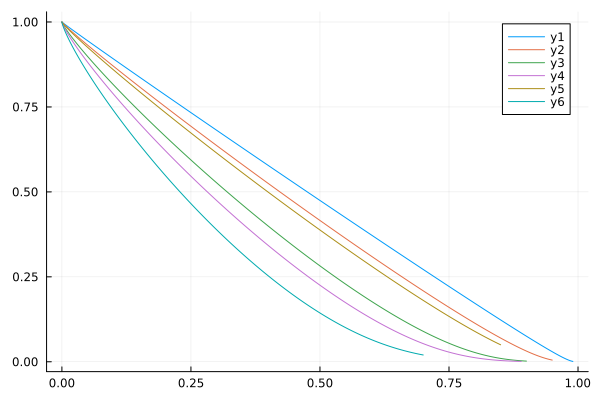

In [18]:
using Plots

ax,ay = path_with_int(0.99,0.001)
plot(ax,ay)
bx,by = path_with_int(0.95,0.005)
plot!(bx,by)
cx,cy = path_with_int(0.9,0.002)
plot!(cx,cy)
dx,dy = path_with_int(0.89,0.001)
plot!(dx,dy)
ex,ey = path_with_int(0.85,0.05)
plot!(ex,ey)
fx,fy = path_with_int(0.7,0.02)
plot!(fx,fy)


In [19]:
function Unitvect(x,y)
    u = -x*(1-x+3*y)
    v = (3 + x - 3*y)*y
    N = 20
    normalizaing = sqrt(u^2+v^2) * N
    return u/normalizaing,v/normalizaing
end


Unitvect (generic function with 1 method)

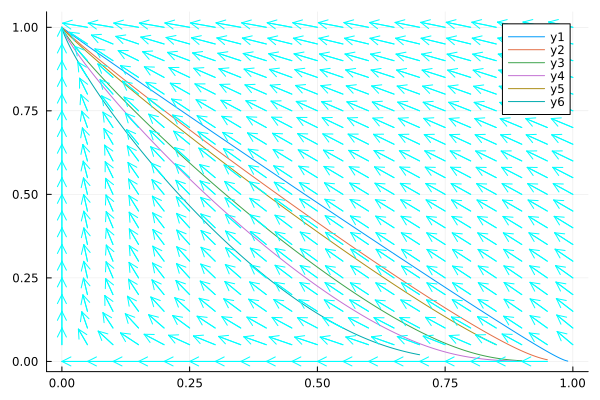

In [20]:
x=range(0,1,21)
vector = vec([(x[i],x[j]) for i=1:length(x), j=1:length(x)])
quiver!(vector,quiver=Unitvect,color = "aqua")

Taking example fo a cosh-like potential (Described in Part V)
$$ V = V_0 \cosh (\mu \Chi)$$ 
working on which gives new coordinates from previous ones as 
$$
x' = - \frac 3 2 x(1-x^2+y^2) - \sqrt {\frac 3 2} y^2 z  
\newline
y' = \frac 3 2 y (1+x^2 - y^2) +\sqrt{\frac 3 2} xyz 
\newline 
z' = \sqrt{6} x (\mu ^2 - z^2 )
$$

In [21]:
function D3path(x0,y0,z0,μ)
    dt = 0.001
    T = 1:dt:10
    N = length(T)
    x = zeros(N)
    y = zeros(N)
    z = zeros(N)

    x[1] = x0
    y[1] = y0
    z[1] = z0
    
    for i in 2:N
        x[i] = x[i-1] +dt*(-1.5*x[i-1]*(1-x[i-1]^2 + y[i-1] ^2) - sqrt(1.5)*y[i-1]^2*z[i-1]) 
        y[i] = y[i-1] +dt*(1.5*y[i-1]*(1+x[i-1]^2 - y[i-1] ^2) + sqrt(1.5)*y[i-1]*x[i-1]*z[i-1])
        z[i] = z[i-1] + dt*(sqrt(6)*x[i-1]*(μ^2 - z[i-1]^2))
    end
    return x,y,z
end

D3path (generic function with 1 method)

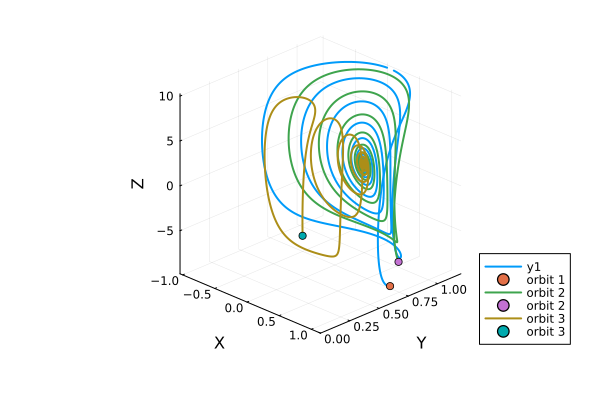

In [22]:
using Plots

ax,ay,az = D3path(0.95,0.7,-9,10)
plot(ax,ay,az,xlabel="X",ylabel="Y",zlabel="Z",camera=(45,25),ylim=(0,1.2),w=2,lable = "orbit 1")
scatter!([ax[1]],[ay[1]],[az[1]],label="orbit 1")

bx,by,bz = D3path(0.9,0.8,-7,10)
plot!(bx,by,bz,ylim=(0,1.2),w=2,label="orbit 2")
scatter!([bx[1]],[by[1]],[bz[1]],label="orbit 2")

cx,cy,cz = D3path(0.5,0.2,-2,10)
plot!(cx,cy,cz,ylim=(0,1.2),w=2,label="orbit 3")
scatter!([cx[1]],[cy[1]],[cz[1]],label="orbit 3")


In [23]:
function Unitvect3(x,y,z)
    p = -1.5*x*(1-x^2 + y^2) - sqrt(1.5)*y^2*z
    q = 1.5*y*(1+x^2 - y^2) + sqrt(1.5)*y*x*z
    r = sqrt(6)*x*(10^2 - z^2)
    N = 20
    normalizaing = sqrt(p^2 + q^2 + r^2) * N
    return p/normalizaing,q/normalizaing,r/normalizaing
end

Unitvect3 (generic function with 1 method)

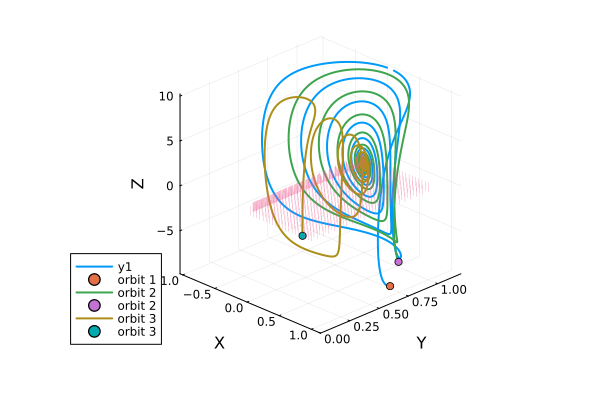

In [24]:
x_axis=range(0,1,21)
vector = vec([(x[i],x[j],x[k]) for i=1:length(x), j=1:length(x), k=1:length(x)])
quiver!(vector,quiver=Unitvect3, w = 0.2)
